# COURSE: A deep understanding of deep learning
## SECTION: Style transfer
### LECTURE: CodeChallenge: Style transfer with AlexNet
#### TEACHER: Mike X Cohen, sincxpress.com
##### COURSE URL: udemy.com/course/deeplearning_x/?couponCode=202401

In [120]:
### import libraries

# for DL modeling
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as T

# to read an image from a url
from imageio import imread

# for number-crunching
import numpy as np

# for data visualization
import matplotlib.pyplot as plt
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg')

/tmp/ipykernel_23841/3204169295.py:19: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg')


# Import VGG19 and freeze all layers

In [121]:
# import the model
vggnet = torchvision.models.alexnet(weights=torchvision.models.AlexNet_Weights.DEFAULT)

# freeze all layers
for p in vggnet.parameters():
    p.requires_grad = False
  
# set to evaluation mode
vggnet.eval()

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [122]:
# send the network to the GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

vggnet.to(device);

# Import two images

In [123]:
img4style       = imread('https://upload.wikimedia.org/wikipedia/commons/thumb/f/fd/El_Tres_de_Mayo%2C_by_Francisco_de_Goya%2C_from_Prado_thin_black_margin.jpg/1280px-El_Tres_de_Mayo%2C_by_Francisco_de_Goya%2C_from_Prado_thin_black_margin.jpg')
img4content     = imread('https://i.pinimg.com/originals/9c/bf/71/9cbf718ea660485552915790d96089e4.jpg')
# img4content = imread('https://upload.wikimedia.org/wikipedia/commons/6/61/De_nieuwe_vleugel_van_het_Stedelijk_Museum_Amsterdam.jpg')
# img4style   = imread('https://upload.wikimedia.org/wikipedia/commons/c/c5/Edvard_Munch%2C_1893%2C_The_Scream%2C_oil%2C_tempera_and_pastel_on_cardboard%2C_91_x_73_cm%2C_National_Gallery_of_Norway.jpg')
# initialize the target image and random numbers
img4target = np.random.randint(low=0,high=255,size=img4content.shape,dtype=np.uint8)

print(img4content.shape)
print(img4target.shape)
print(img4style.shape)

/tmp/ipykernel_23841/1642939246.py:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img4style       = imread('https://upload.wikimedia.org/wikipedia/commons/thumb/f/fd/El_Tres_de_Mayo%2C_by_Francisco_de_Goya%2C_from_Prado_thin_black_margin.jpg/1280px-El_Tres_de_Mayo%2C_by_Francisco_de_Goya%2C_from_Prado_thin_black_margin.jpg')
/tmp/ipykernel_23841/1642939246.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img4content     = imread('https://i.pinimg.com/originals/9c/bf/71/9cbf718ea660485552915790d96089e4.jpg')


(2592, 2196, 3)
(2592, 2196, 3)
(989, 1280, 3)


In [124]:
## These images are really large, which will make training take a long time. 

# create the transforms. T because transformation
Ts = T.Compose([ T.ToTensor(),
                 T.Resize(256),
                 T.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225]) # values the vggnet was trained on
               ])

# apply them to the images ("unsqueeze" to make them a 4D tensor (batch_size, channels, height, width)) and push to GPU
img4content = Ts( img4content ).unsqueeze(0).to(device)
img4style   = Ts( img4style   ).unsqueeze(0).to(device)
img4target  = Ts( img4target  ).unsqueeze(0).to(device)

print(img4content.shape)
print(img4target.shape)
print(img4style.shape)

torch.Size([1, 3, 302, 256])
torch.Size([1, 3, 302, 256])
torch.Size([1, 3, 256, 331])


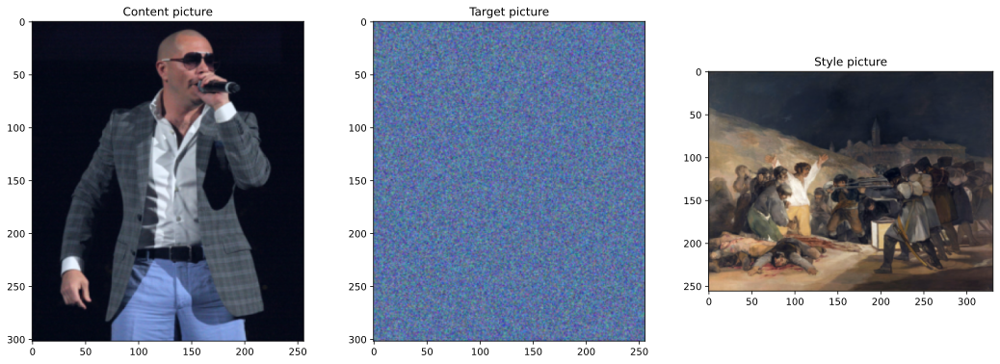

In [125]:
# Let's have a look at the "before" pics
fig,ax = plt.subplots(1,3,figsize=(18,6))

pic = img4content.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[0].imshow(pic)
ax[0].set_title('Content picture')

pic = img4target.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[1].imshow(pic)
ax[1].set_title('Target picture')

pic = img4style.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[2].imshow(pic)
ax[2].set_title('Style picture')

plt.show()

# Functions to extract image feature map activations

In [126]:
# A function that returns feature maps

def getFeatureMapActs(img,net):
  
  # initialize feature maps as a list
  featuremaps = []
  featurenames = []

  convLayerIdx = 0

  # loop through all layers in the "features" block
  for layernum in range(len(net.features)):
    
    # print out info from this layer
    # print(layernum,net.features[layernum])

    # process the image through this layer
    img = net.features[layernum](img)

    # store the image if it's a conv2d layer
    if 'Conv2d' in str(net.features[layernum]):
      featuremaps.append( img )
      featurenames.append( 'ConvLayer_' + str(convLayerIdx) )
      convLayerIdx += 1
  
  return featuremaps,featurenames

In [127]:
# A function that returns the Gram matrix of the feature activation map

def gram_matrix(M):
  
  # reshape to 2D
  _,chans,height,width = M.shape
  M = M.reshape(chans,height*width)  

  # compute and return covariance matrix
  gram = torch.mm(M,M.t()) / (chans*height*width) # we divide it by N (number of pixels)
  return gram

In [128]:
# inspect the output of the function
featmaps,featnames = getFeatureMapActs(img4content,vggnet)

# print out some info
for i in range(len(featnames)):
  print('Feature map "%s" is size %s'%(featnames[i],(featmaps[i].shape)))

Feature map "ConvLayer_0" is size torch.Size([1, 64, 74, 63])
Feature map "ConvLayer_1" is size torch.Size([1, 192, 36, 31])
Feature map "ConvLayer_2" is size torch.Size([1, 384, 17, 15])
Feature map "ConvLayer_3" is size torch.Size([1, 256, 17, 15])
Feature map "ConvLayer_4" is size torch.Size([1, 256, 17, 15])


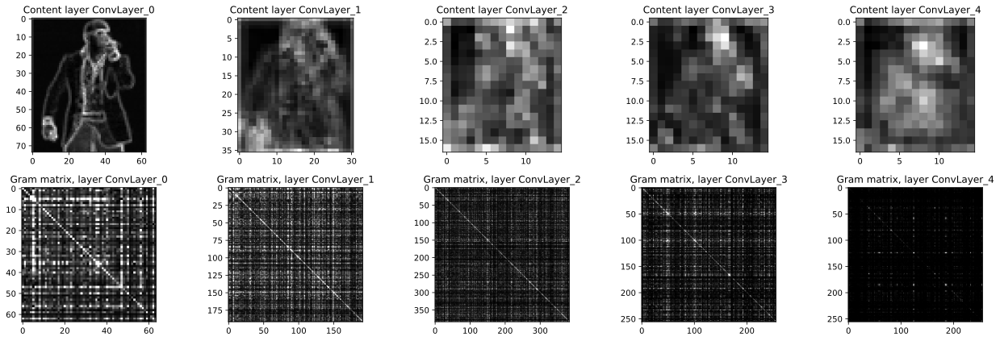

In [129]:
# let's see what the "content" image looks like
contentFeatureMaps,contentFeatureNames = getFeatureMapActs(img4content,vggnet)


fig,axs = plt.subplots(2,5,figsize=(18,6))
for i in range(5):

  # average over all feature maps from this layer, and normalize
  pic = np.mean( contentFeatureMaps[i].cpu().squeeze().numpy() ,axis=0)
  pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))

  axs[0,i].imshow(pic,cmap='gray')
  axs[0,i].set_title('Content layer ' + str(contentFeatureNames[i]))


  ### now show the gram matrix
  pic = gram_matrix(contentFeatureMaps[i]).cpu().numpy()
  pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))

  axs[1,i].imshow(pic,cmap='gray',vmax=.1)
  axs[1,i].set_title('Gram matrix, layer ' + str(contentFeatureNames[i]))

plt.tight_layout()
plt.show()

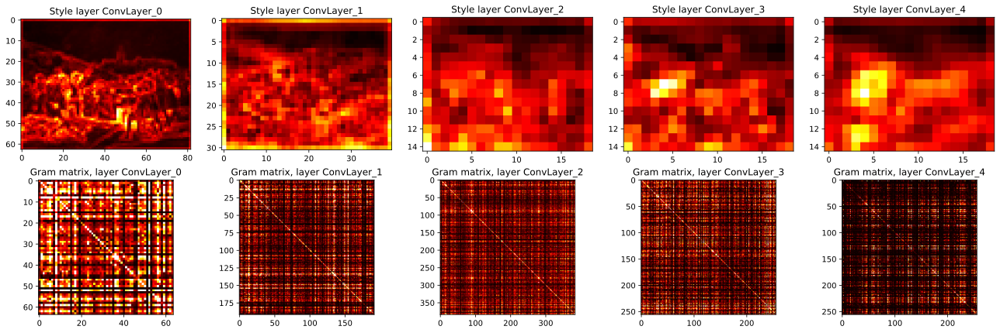

In [130]:

# repeat for the "style" image
styleFeatureMaps,styleFeatureNames = getFeatureMapActs(img4style,vggnet)


fig,axs = plt.subplots(2,5,figsize=(18,6))
for i in range(5):

  # average over all feature maps from this layer, and normalize
  pic = np.mean( styleFeatureMaps[i].cpu().squeeze().numpy() ,axis=0)
  pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))

  axs[0,i].imshow(pic,cmap='hot')
  axs[0,i].set_title('Style layer ' + str(styleFeatureNames[i]))


  ### now show the gram matrix
  pic = gram_matrix(styleFeatureMaps[i]).cpu().numpy()
  pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))

  axs[1,i].imshow(pic,cmap='hot',vmax=.1)
  axs[1,i].set_title('Gram matrix, layer ' + str(styleFeatureNames[i]))

plt.tight_layout()
plt.show()

# Now for the transfer

In [136]:
# which layers to use
layers4content = [ 'ConvLayer_1']
layers4style   = [ 'ConvLayer_1','ConvLayer_2','ConvLayer_3','ConvLayer_4','ConvLayer_5']
weights4style  = [      1       ,     .5      ,     .5      ,     .2      ,     .1       ]
# layers4content = [ 'ConvLayer_1','ConvLayer_2','ConvLayer_3','ConvLayer_4' ]
# layers4style   = [ 'ConvLayer_1','ConvLayer_2','ConvLayer_3','ConvLayer_4','ConvLayer_5','ConvLayer_6','ConvLayer_7','ConvLayer_8','ConvLayer_9','ConvLayer_10']
# weights4style  = [1,1,.5,.5,.5,.5,.2,.2,.1,.1]

In [139]:
# make a copy of the target image and push to GPU
target = img4target.clone()
target.requires_grad = True # this is the image we will optimize
target = target.to(device)
# styleScaling = 1e6 # to scale the style loss relative to the content loss
styleScaling = 100000 # to scale the style loss relative to the content loss

# number of epochs to train
numepochs = 4000

# optimizer for backprop
optimizer = torch.optim.RMSprop([target],lr=.005) # recommended method for this architecture. As we assign the target image to the optimizer, it will update the pixel values of the target image during training.

# Store losses for each epoch
loss_history = []

# Store intermediate images
intermediate_images = []

for epochi in range(numepochs):

  # extract the target feature maps
  targetFeatureMaps,targetFeatureNames = getFeatureMapActs(target,vggnet)


  # initialize the individual loss components
  styleLoss = 0
  contentLoss = 0

  # loop over layers
  for layeri in range(len(targetFeatureNames)):


    # compute the content loss
    if targetFeatureNames[layeri] in layers4content:
      contentLoss += torch.mean( (targetFeatureMaps[layeri]-contentFeatureMaps[layeri])**2 )


    # compute the style loss
    if targetFeatureNames[layeri] in layers4style:
      
      # Gram matrices
      Gtarget = gram_matrix(targetFeatureMaps[layeri])
      Gstyle  = gram_matrix(styleFeatureMaps[layeri])

      # compute their loss (de-weighted with increasing depth)
      styleLoss += torch.mean( (Gtarget-Gstyle)**2 ) * weights4style[layers4style.index(targetFeatureNames[layeri])]

  
  # combined loss
  combiloss = styleScaling*styleLoss + contentLoss
  losses = [contentLoss.item(), styleScaling*styleLoss.item(), combiloss.item()]
  loss_history.append(losses)

  # finally ready for backprop!
  optimizer.zero_grad()
  combiloss.backward()
  optimizer.step() # here target it's updated.

  if epochi % 100 == 0:
    intermediate_images.append(target.clone().detach().cpu())


# Let's have a looksie!

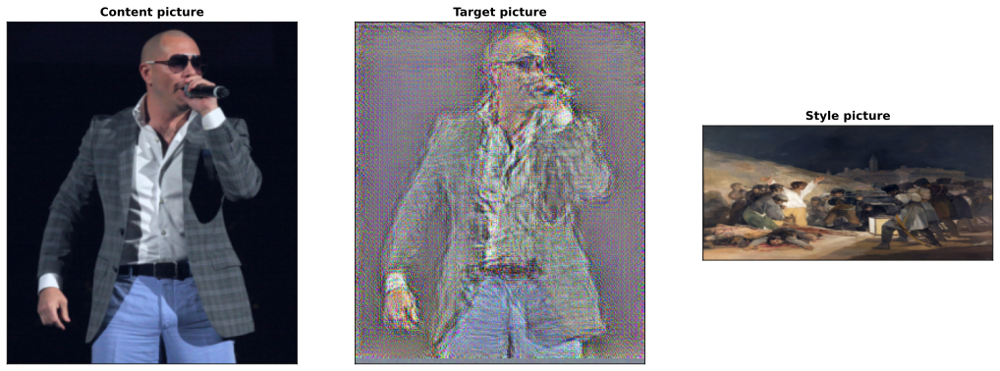

In [140]:
# the "after" pic
fig,ax = plt.subplots(1,3,figsize=(18,11))

pic = img4content.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[0].imshow(pic)
ax[0].set_title('Content picture',fontweight='bold')
ax[0].set_xticks([])
ax[0].set_yticks([])

pic = torch.sigmoid(target).cpu().detach().squeeze().numpy().transpose((1,2,0))
ax[1].imshow(pic)
ax[1].set_title('Target picture',fontweight='bold')
ax[1].set_xticks([])
ax[1].set_yticks([])

pic = img4style.cpu().squeeze().numpy().transpose((1,2,0))
pic = (pic-np.min(pic)) / (np.max(pic)-np.min(pic))
ax[2].imshow(pic,aspect=.6)
ax[2].set_title('Style picture',fontweight='bold')
ax[2].set_xticks([])
ax[2].set_yticks([])

plt.show()

# Visualize intermediate images

In [134]:
n_images = len(intermediate_images)
fig, axes = plt.subplots(1, n_images, figsize=(4*n_images, 4))

if n_images == 1:
    axes = [axes]

for idx, img in enumerate(intermediate_images):
    pic = torch.sigmoid(img).squeeze().numpy().transpose((1,2,0))
    axes[idx].imshow(pic)
    axes[idx].set_title(f'Epoch {idx*100}')
    axes[idx].axis('off')

# Let's study the loss

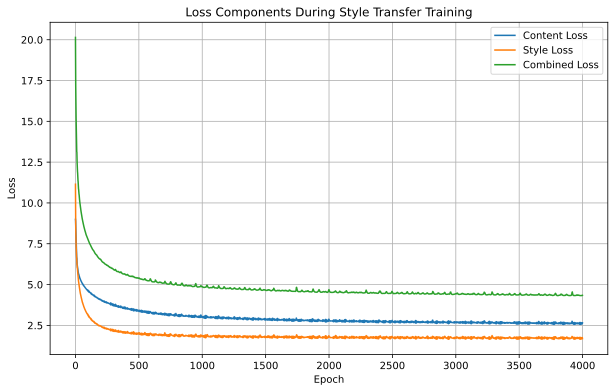

In [135]:
# Plot the loss history for content, style, and combined loss
import matplotlib.pyplot as plt

loss_history = np.array(loss_history)
plt.figure(figsize=(10,6))
plt.plot(loss_history[:,0], label='Content Loss')
plt.plot(loss_history[:,1], label='Style Loss')
plt.plot(loss_history[:,2], label='Combined Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Components During Style Transfer Training')
plt.legend()
plt.grid(True)
plt.show()